# 1. Package Preparation

In [1]:
from numpy import array
import gensim
from gensim.corpora.dictionary import Dictionary
from gensim.models.ldamodel import LdaModel
from gensim.models.ldamulticore import LdaMulticore
from gensim.models.coherencemodel import CoherenceModel
from gensim.utils import simple_preprocess
import gensim.corpora as corpora
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
from imp import reload

from pyinflect import getAllInflections
from nltk.stem import PorterStemmer # Great stemmer
from nltk.stem import LancasterStemmer # over-stemming easily, more aggresive stemmer
from nltk.stem.snowball import SnowballStemmer # stemmer for non-english languages
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.stem import WordNetLemmatizer # lemmatizer (词形还原)
from sklearn.feature_extraction.text import TfidfVectorizer # get tf-idf matrix

import spacy
import pymysql
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import re
from tqdm import tqdm
from zhon import hanzi
import string
from nltk.corpus import stopwords
import nltk
import time as t

import warnings
import sys
# To ignore all warnings that arise here to enhance clarity
warnings.filterwarnings('ignore')

# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])
stop_words.extend( [ "",
                    "a",
                    "able",
                    "about",
                    "above",
                    "according",
                    "accordingly",
                    "across",
                    "actually",
                    "after",
                    "afterwards",
                    "again",
                    "against",
                    "all",
                    "allow",
                    "almost",
                    "alone",
                    "along",
                    "already",
                    "also",
                    "although",
                    "always",
                    "am",
                    "among",
                    "amongst",
                    "an",
                    "and",
                    "another",
                    "any",
                    "anybody",
                    "anyhow",
                    "anyone",
                    "anything",
                    "anyway",
                    "anyways",
                    "anywhere",
                    "apart",
                    "appear",
                    "appreciate",
                    "appropriate",
                    "are",
                    "around",
                    "as",
                    "aside",
                    "ask",
                    "asking",
                    "associated",
                    "at",
                    "available",
                    "away",
                    "awfully",
                    "b",
                    "be",
                    "became",
                    "because",
                    "become",
                    "becomes",
                    "becoming",
                    "been",
                    "before",
                    "beforehand",
                    "behind",
                    "being",
                    "believe",
                    "below",
                    "beside",
                    "besides",
                    "best",
                    "better",
                    "between",
                    "beyond",
                    "both",
                    "brief",
                    "but",
                    "by",
                    "c",
                    "came",
                    "can",
                    "cannot",
                    "cant",
                    "cause",
                    "causes",
                    "certain",
                    "certainly",
                    "changes",
                    "clearly",
                    "co",
                    "com",
                    "come",
                    "comes",
                    "concerning",
                    "consequently",
                    "consider",
                    "considering",
                    "contain",
                    "containing",
                    "contains",
                    "corresponding",
                    "could",
                    "course",
                    "currently",
                    "d",
                    "definitely",
                    "described",
                    "despite",
                    "did",
                    "different",
                    "do",
                    "does",
                    "doing",
                    "done",
                    "down",
                    "downwards",
                    "during",
                    "dr",
                    "e",
                    "each",
                    "edu",
                    "eg",
                    "eight",
                    "either",
                    "else",
                    "elsewhere",
                    "enough",
                    "entirely",
                    "especially",
                    "et",
                    "etc",
                    "even",
                    "ever",
                    "every",
                    "everybody",
                    "everyone",
                    "everything",
                    "everywhere",
                    "ex",
                    "exactly",
                    "example",
                    "except",
                    "f",
                    "far",
                    "few",
                    "fifth",
                    "first",
                    "five",
                    "followed",
                    "following",
                    "follows",
                    "for",
                    "former",
                    "formerly",
                    "forth",
                    "four",
                    "from",
                    "further",
                    "furthermore",
                    "g",
                    "get",
                    "gets",
                    "getting",
                    "give",
                    "given",
                    "gives",
                    "go",
                    "goes",
                    "going",
                    "gone",
                    "got",
                    "gotten",
                    "greetings",
                    "h",
                    "had",
                    "happens",
                    "hardly",
                    "has",
                    "have",
                    "having",
                    "he",
                    "hello",
                    "help",
                    "hence",
                    "her",
                    "here",
                    "hereafter",
                    "hereby",
                    "herein",
                    "hereupon",
                    "hers",
                    "herself",
                    "hi",
                    "him",
                    "himself",
                    "his",
                    "hither",
                    "hopefully",
                    "how",
                    "howbeit",
                    "however",
                    "i",
                    "ie",
                    "if",
                    "ignored",
                    "immediate",
                    "in",
                    "inasmuch",
                    "inc",
                    "indeed",
                    "indicate",
                    "indicated",
                    "indicates",
                    "inner",
                    "insofar",
                    "instead",
                    "into",
                    "inward",
                    "is",
                    "it",
                    "its",
                    "itself",
                    "j",
                    "just",
                    "k",
                    "km",
                    "keep",
                    "keeps",
                    "kept",
                    "know",
                    "knows",
                    "known",
                    "l",
                    "last",
                    "lately",
                    "later",
                    "latter",
                    "latterly",
                    "least",
                    "less",
                    "lest",
                    "let",
                    "like",
                    "liked",
                    "likely",
                    "little",
                    "look",
                    "looking",
                    "looks",
                    "ltd",
                    "m",
                    "mainly",
                    "many",
                    "may",
                    "maybe",
                    "me",
                    "ms",
                    "mean",
                    "meanwhile",
                    "merely",
                    "might",
                    "more",
                    "moreover",
                    "most",
                    "mostly",
                    "much",
                    "must",
                    "my",
                    "myself",
                    "n",
                    "name",
                    "namely",
                    "nd",
                    "near",
                    "nearly",
                    "necessary",
                    "need",
                    "needs",
                    "neither",
                    "never",
                    "nevertheless",
                    "new",
                    "next",
                    "nine",
                    "no",
                    "nobody",
                    "non",
                    "none",
                    "noone",
                    "nor",
                    "normally",
                    "not",
                    "nothing",
                    "novel",
                    "now",
                    "nowhere",
                    "o",
                    "obviously",
                    "of",
                    "off",
                    "often",
                    "oh",
                    "ok",
                    "okay",
                    "old",
                    "on",
                    "once",
                    "one",
                    "ones",
                    "only",
                    "onto",
                    "or",
                    "other",
                    "others",
                    "otherwise",
                    "ought",
                    "our",
                    "ours",
                    "ourselves",
                    "out",
                    "outside",
                    "over",
                    "overall",
                    "own",
                    "p",
                    "particular",
                    "particularly",
                    "per",
                    "perhaps",
                    "placed",
                    "please",
                    "plus",
                    "possible",
                    "presumably",
                    "probably",
                    "provides",
                    "q",
                    "que",
                    "quite",
                    "qv",
                    "r",
                    "rather",
                    "rd",
                    "re",
                    "really",
                    "reasonably",
                    "regarding",
                    "regardless",
                    "regards",
                    "relatively",
                    "respectively",
                    "right",
                    "s",
                    "said",
                    "same",
                    "saw",
                    "say",
                    "saying",
                    "says",
                    "second",
                    "secondly",
                    "see",
                    "seeing",
                    "seem",
                    "seemed",
                    "seeming",
                    "seems",
                    "seen",
                    "self",
                    "selves",
                    "sensible",
                    "sent",
                    "serious",
                    "seriously",
                    "seven",
                    "several",
                    "shall",
                    "she",
                    "should",
                    "since",
                    "six",
                    "so",
                    "some",
                    "somebody",
                    "somehow",
                    "someone",
                    "something",
                    "sometime",
                    "sometimes",
                    "somewhat",
                    "somewhere",
                    "soon",
                    "sorry",
                    "specified",
                    "specify",
                    "specifying",
                    "still",
                    "sub",
                    "such",
                    "sup",
                    "sure",
                    "t",
                    "take",
                    "taken",
                    "tell",
                    "tends",
                    "th",
                    "than",
                    "thank",
                    "thanks",
                    "thanx",
                    "that",
                    "thats",
                    "the",
                    "their",
                    "theirs",
                    "them",
                    "themselves",
                    "then",
                    "thence",
                    "there",
                    "thereafter",
                    "thereby",
                    "therefore",
                    "therein",
                    "theres",
                    "thereupon",
                    "these",
                    "they",
                    "think",
                    "third",
                    "this",
                    "thorough",
                    "thoroughly",
                    "those",
                    "though",
                    "three",
                    "through",
                    "throughout",
                    "thru",
                    "thus",
                    "to",
                    "together",
                    "too",
                    "took",
                    "toward",
                    "towards",
                    "tried",
                    "tries",
                    "truly",
                    "try",
                    "trying",
                    "twice",
                    "two",
                    "u",
                    "un",
                    "under",
                    "unfortunately",
                    "unless",
                    "unlikely",
                    "until",
                    "unto",
                    "up",
                    "upon",
                    "us",
                    "use",
                    "used",
                    "useful",
                    "uses",
                    "using",
                    "usually",
                    "uucp",
                    "v",
                    "value",
                    "various",
                    "very",
                    "via",
                    "viz",
                    "vs",
                    "w",
                    "want",
                    "wants",
                    "was",
                    "way",
                    "we",
                    "welcome",
                    "well",
                    "went",
                    "were",
                    "what",
                    "whatever",
                    "when",
                    "whence",
                    "whenever",
                    "where",
                    "whereafter",
                    "whereas",
                    "whereby",
                    "wherein",
                    "whereupon",
                    "wherever",
                    "whether",
                    "which",
                    "while",
                    "whither",
                    "who",
                    "whoever",
                    "whole",
                    "whom",
                    "whose",
                    "why",
                    "will",
                    "willing",
                    "wish",
                    "with",
                    "within",
                    "without",
                    "wonder",
                    "would",
                    "would",
                    "x",
                    "y",
                    "yes",
                    "yet",
                    "you",
                    "your",
                    "yours",
                    "yourself",
                    "yourselves",
                    "z",
                    "zero",
                    "project",
                    "overall project summary",
                    "abstract",
                    "project description",
                    "description",
                    "summary",
                    "description provided by applicant:",
                    "overall",
                    "applicant",
                    "purpose",
                    "summaryabstract",
                    "descriptionabstract",
                    "made",
                    "highly",
                    "research",
                    "important",
                    "study",
                    "examine",
                    "questions",
                    "range",
                    "funding",
                    "funded",
                    "program",
                    "large",
                    "based",
                    "areas",
                    "high",
                    "field",
                    "show",
                    "provide",
                    "successful",
                    "application",
                    "proposal",
                    "lead",
                    "approach",
                    "closely",
                    "knowledge",
                    "continued",
                    "support",
                    "receive",
                    "method",
                    "david",
                    "greatly",
                    "seminar",
                    "face",
                    "shown",
                    "needed",
                    "area",
                    "academic",
                    "worldwide",
                    "proposed",
                    "great",
                    "goal",
                    "focus",
                    "specific",
                    "remains",
                    "essential",
                    "small",
                    "big",
                    "large",
                    "recently",
                    "supports",
                    "successfully",
                    "require",
                    "students",
                    "training",
                    "support",
                    "program",
                    'https',
                    'doi',
                    'org',
                    'www',
                    "http",
                    "identify",
                    "function",
                    "call",
                    "measure",
                    "understand",
                    "china",
                    "uk",
                    "easet",
                    "north",
                    "africa",
                    "india",
                    "west",
                    "south",
                    "january",
                    "february",
                    "march",
                    "april",
                    "may",
                    "june",
                    "july",
                    "august",
                    "september",
                    "october",
                    "november",
                    "december",
                    "measure",
                    "call",
                    "local",
                    "investigate",
                    "english",
                    "chinese",
                    "apply",
                    "cover",
                    "programme",
                    "propose",
                    "award",
                    "enable",
                    "participation",
                    "decide",
                    "pursue",
                    "work",
                    "survey",
                    "underly",
                    "objective",
                    "contact",
                    "progress",
                    "due",
                    "extend",
                    "induce",
                    "test",
                    "count",
                    "detected",
                    "recent", "research", 'project', "study", "cell", "model",
                    "th", "nd", "rd",
                    "i", "ii", "iii", "iv", "v", "vi", "vii", "viii", "lt",
                    "relate", "data", "significant", "develop", "make", "base"
                    "oxford", "programme", "japanese", "durham", "aim", "include", 
                    "british", "london", "sector", "affect", "sheet", "aspect", "main", 'increase', 'input', 'vast', 'amount'
                    "detail", 'future', 'dataset', 'unique', 'linkage', "predict", 'channel', 'experience', 
                    "bed", "poorly", 'estimate'])
stop_words = set(stop_words)

def stemmed_stop_words(sw = stop_words):
    port = PorterStemmer()
    return set([port.stem(token) for token in stop_words])

stemmed_stop_words = stemmed_stop_words()

%matplotlib inline
warnings.filterwarnings("ignore",category=DeprecationWarning)
# logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

/Users/kyle/anaconda3/envs/voila/lib/python3.8/site-packages/tensorflow/python/framework/dtypes.py:29: DeprecationWarning: `np.typeDict` is a deprecated alias for `np.sctypeDict`.
  from tensorflow.python.lib.core import _pywrap_bfloat16
/Users/kyle/anaconda3/envs/voila/lib/python3.8/site-packages/tensorflow/python/framework/dtypes.py:511: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  np.object,
/Users/kyle/anaconda3/envs/voila/lib/python3.8/site-packages/tensorflow/python/framework/dtypes.py:553: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidan

In [2]:
# print(stop_words)

# 2. Import Dataset

In [3]:
df = pd.read_csv("../Data/cleanData.csv")
data = df.abstract.tolist()

In [4]:
df

,title,abstract,aID,year,amount,institution,country,county,agency,sDate,eDate
0,Bioinspired Composites Strategies for Saving E...,Saving energy together with energy harvesting ...,948840,2021,1694375.0,AGH University of Science and Technology Krakow,Poland,Krakow,ERC,2021-01-01,2025-12-31
1,Pragmatics of Multiwinner Voting Algorithms a...,This proposal is in the area of computational ...,101002854,2021,1386290.0,AGH University of Science and Technology Krakow,Poland,Krakow,ERC,2021-06-01,2026-05-31
2,Exotic superconducting CIrcuits to Probe and p...,Quantum systems can occupy peculiar states suc...,851740,2020,1498875.0,ARMINES - Association for Research and Develop...,France,Paris,ERC,2020-03-01,2025-02-28
3,Quantum Feedback Engineering,Quantum technologies such as quantum computers...,884762,2020,2440125.0,ARMINES - Association for Research and Develop...,France,Paris,ERC,2020-12-01,2025-11-30
4,Artificial Enzyme Modules as Tools in a Tailor...,In order to tackle some of the prime societal ...,865885,2020,1995707.0,Aalto University,Finland,Aalto,ERC,2020-11-01,2025-10-31
...,...,...,...,...,...,...,...,...,...,...,...
145782,Mouse Models of Neurodegenerative Diseases Lab...,Neurodegeneration is defined by loss of specif...,MC_EX_MR/N501931/1,2017,1781285.0,MRC Mammalian Genetics Unit,UK,South East,UKRI,2017-01-01,2020-03-31
145783,SCREENswitch Switchable Opacity Patient Isola...,Many people have been put into isolation in ho...,79146,2020,59884.0,Korn Wall Limited,UK,Unknown,UKRI,2020-10-01,2020-12-31
145784,Virtual Cathode Deposition feasibility study f...,Increasing demand for small low cost powerful ...,132365,2016,104880.0,Plasma App Ltd.,UK,South East,UKRI,2016-07-01,2017-06-30
145785,Squidge amp Pip,Obtaining expert advice from a knowledgeable s...,752626,2015,5000.0,Lefendarty Limited,UK,Yorkshire and The Humber,UKRI,2015-08-01,2016-01-31


In [5]:
def save_word_list(path, word_list):
    # Save high- and low- freqency words
    with open(path, 'w') as filehandle:
        for listitem in word_list:
            filehandle.write('%s\n' % listitem)
            
def read_word_list(path = '../Data/unimportant_stemmed_words_ALL.txt'):
    with open(path, 'r') as f:
        content = f.readlines()
    # you may also want to remove whitespace characters like `\n` at the end of each line
    return [x.replace("\n", '').strip() for x in content]

In [6]:
def remove_short_text(data, numWords=5):
    col = data['data_ready'].apply(lambda s: True if len(s) > numWords else False).tolist()
    data = data[data.index.isin([i for i, x in enumerate(col) if x])]
    data.reset_index(drop = True, inplace = True)
    return data

## Import Documents

In [7]:
# Imdata_readyents
doc_ready = read_word_list('../Data/data_ready/doc.txt')
data_ready = [doc.split() for doc in doc_ready]

In [8]:
len(data_ready)

145787

## Processing Documents

In [9]:
df["data_ready"] = data_ready

In [10]:
df = remove_short_text(df, 5)

In [11]:
df

,title,abstract,aID,year,amount,institution,country,county,agency,sDate,eDate,data_ready
0,Bioinspired Composites Strategies for Saving E...,Saving energy together with energy harvesting ...,948840,2021,1694375.0,AGH University of Science and Technology Krakow,Poland,Krakow,ERC,2021-01-01,2025-12-31,"[save, energi, energy_harvest, demand, power, ..."
1,Pragmatics of Multiwinner Voting Algorithms a...,This proposal is in the area of computational ...,101002854,2021,1386290.0,AGH University of Science and Technology Krakow,Poland,Krakow,ERC,2021-06-01,2026-05-31,"[comput, social, choic, intersect, comput, sci..."
2,Exotic superconducting CIrcuits to Probe and p...,Quantum systems can occupy peculiar states suc...,851740,2020,1498875.0,ARMINES - Association for Research and Develop...,France,Paris,ERC,2020-03-01,2025-02-28,"[quantum, system, occupi, peculiar, state, sup..."
3,Quantum Feedback Engineering,Quantum technologies such as quantum computers...,884762,2020,2440125.0,ARMINES - Association for Research and Develop...,France,Paris,ERC,2020-12-01,2025-11-30,"[quantum, technolog, quantum_comput, simul, po..."
4,Artificial Enzyme Modules as Tools in a Tailor...,In order to tackle some of the prime societal ...,865885,2020,1995707.0,Aalto University,Finland,Aalto,ERC,2020-11-01,2025-10-31,"[order, tackl, prime, societ, challeng, centur..."
...,...,...,...,...,...,...,...,...,...,...,...,...
145707,Mouse Models of Neurodegenerative Diseases Lab...,Neurodegeneration is defined by loss of specif...,MC_EX_MR/N501931/1,2017,1781285.0,MRC Mammalian Genetics Unit,UK,South East,UKRI,2017-01-01,2020-03-31,"[defin, loss, type, neuron, brain, spinal_cord..."
145708,SCREENswitch Switchable Opacity Patient Isola...,Many people have been put into isolation in ho...,79146,2020,59884.0,Korn Wall Limited,UK,Unknown,UKRI,2020-10-01,2020-12-31,"[peopl, put, isol, hospit, covid, pandem, pers..."
145709,Virtual Cathode Deposition feasibility study f...,Increasing demand for small low cost powerful ...,132365,2016,104880.0,Plasma App Ltd.,UK,South East,UKRI,2016-07-01,2017-06-30,"[demand, low, cost, power, batteri, batteri, c..."
145710,Squidge amp Pip,Obtaining expert advice from a knowledgeable s...,752626,2015,5000.0,Lefendarty Limited,UK,Yorkshire and The Humber,UKRI,2015-08-01,2016-01-31,"[obtain, expert, advic, supplier, turn, innov,..."


In [12]:
data_ready = df.data_ready.tolist()

In [13]:
len(data_ready)

145712

In [14]:
len([word for wl in data_ready for word in wl])

24944683

In [15]:
all_unique_words = list(set([word for wl in data_ready for word in wl]))
len(all_unique_words)

210655

In [16]:
# Create Dictionary
id2word = corpora.Dictionary(data_ready)
id2word.filter_extremes(no_below = len(data_ready) * 0.001, no_above=0.8)
# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in data_ready]

In [17]:
len([k for k, v in id2word.token2id.items()])

7060

In [18]:
len(corpus)

145712

# 5. Build the Topic Model

To build the LDA topic model using `LdaModel()`, you need the corpus and the dictionary. Let’s create them first and then build the model. The trained topics (keywords and weights) are printed below as well.

If you examine the topic key words, they are nicely segregate and collectively represent the topics we initially chose: Christianity, Hockey, MidEast and Motorcycles. Nice!

## Model Selection

In [20]:
from numpy.random import default_rng
def compute_coherence_values(dictionary, corpus, texts, limit, single_model_repeat = 10, LDA_iterations = 10000, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    
    def topic_number_generator(start, limit, step):
        res = [start] if start % step != 0 else []
        for num_topic in range(start, limit + 1):
            if num_topic % step == 0:
                res.append(num_topic)
        return res
    
    model_list = []
    coherence_list = []
    topic_num_list = topic_number_generator(start,limit,step)
    for num_topic in topic_num_list:
        coherence_values = []
        models = []
        for elem in tqdm(range(single_model_repeat)):
            model = LdaModel(corpus=corpus, num_topics=num_topic, id2word=dictionary, iterations = LDA_iterations, random_state=elem)
            models.append(model)
            model.save("../Results/new_res_model8/model_topic{0}_{1}".format(num_topic, elem))
            coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
            coherence_values.append(coherencemodel.get_coherence())
        coherence_list.append(coherence_values)
        save_word_list("../Results/new_res_model8/cohe_topic{}.txt".format(num_topic), coherence_values)
        model_list.append(models)
    return model_list, coherence_list

In [ ]:
# # Can take a long time to run.
# model_list, coherence_list = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_ready, start=8, limit=10, step=2, single_model_repeat = 30)

# 3. Import Model

In [21]:
# ldamodel = LdaModel.load("../Results/topic_selection_res/model_topic8_6")

In [19]:
ldamodel = LdaModel.load("../Results/new_res_model8/model_topic8_19")

In [20]:
ldamodel.print_topics(10, 30)

[(0,
  '0.020*"scienc" + 0.016*"univers" + 0.015*"commun" + 0.015*"educ" + 0.011*"collabor" + 0.010*"school" + 0.009*"activ" + 0.009*"engag" + 0.009*"learn" + 0.009*"nation" + 0.008*"institut" + 0.008*"workshop" + 0.008*"stem" + 0.007*"intern" + 0.007*"opportun" + 0.007*"group" + 0.007*"network" + 0.006*"engin" + 0.006*"scientif" + 0.006*"skill" + 0.006*"build" + 0.006*"public" + 0.006*"practic" + 0.005*"scientist" + 0.005*"undergradu" + 0.005*"team" + 0.005*"career" + 0.005*"graduat" + 0.005*"divers" + 0.005*"teacher"'),
 (1,
  '0.027*"brain" + 0.013*"human" + 0.013*"activ" + 0.011*"neuron" + 0.010*"age" + 0.010*"behaviour" + 0.009*"memori" + 0.008*"signal" + 0.008*"process" + 0.008*"anim" + 0.007*"mechan" + 0.007*"control" + 0.007*"imag" + 0.006*"learn" + 0.006*"muscl" + 0.006*"cognit" + 0.006*"movement" + 0.005*"inform" + 0.005*"disord" + 0.005*"neural" + 0.005*"bodi" + 0.005*"time" + 0.005*"individu" + 0.005*"effect" + 0.005*"nerv" + 0.005*"respons" + 0.004*"sound" + 0.004*"visual"

In [21]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(ldamodel, corpus, ldamodel.id2word, sort_topics = False)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.255666  0.017244       1        1  12.498286
1      0.128358  0.060394       2        1  10.740182
2      0.154703 -0.040367       3        1  13.562361
3      0.050898 -0.221160       4        1   9.425653
4     -0.105924 -0.107592       5        1  15.735006
5      0.135609  0.177621       6        1  18.219918
6     -0.149049  0.136764       7        1  12.843378
7      0.041070 -0.022902       8        1   6.975217, topic_info=         Term           Freq          Total Category  logprob  loglift
294   protein  105200.000000  105200.000000  Default  30.0000  30.0000
550     brain   64818.000000   64818.000000  Default  29.0000  29.0000
584   patient   98828.000000   98828.000000  Default  28.0000  28.0000
557    diseas  127282.000000  127282.000000  Default  27.0000  27.0000
1439   infect   66225.000000   66225.000000  Default  26.0000  26.0000
...       ...            ...            ...      ...      ...      ...
110      time    8263.177382   75201.764163   Topic8  -5.2417   0.4544
1254     year    7149.157536   55034.990301   Topic8  -5.3865   0.6218
105     scale    6462.742413   31111.984911   Topic8  -5.4874   1.0913
103    result    6712.846295   67448.049737   Topic8  -5.4494   0.3555
199    commun    6592.421760   84430.975671   Topic8  -5.4675   0.1128

[689 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
827       1  0.050945   abil
827       2  0.302247   abil
827       3  0.165804   abil
827       4  0.056619   abil
827       5  0.119152   abil
...     ...       ...    ...
1254      8  0.129899   year
2943      3  0.999400  yeast
2943      8  0.000285  yeast
4420      1  0.024215  youth
4420      7  0.975577  youth

[2236 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8])

In [22]:
themes = [
    "Higher Education",
    "Brain Science",
    "Protein Chemistry \n and Microbiology",
    "Material Science\n and Physics",
    "Computer System \n & Commercial Application",
    "Cancer Treatment \n and Immunology",
    "Social Policy \n and Public Healthcare",
    "Climate Change \n and Environment"
]


In [23]:
len(themes)

8

In [24]:
ldamodel.per_word_topics = True

In [25]:
len(corpus)

145712

In [26]:
len(data_ready)

145712

In [27]:
ldamodel.minimum_probability = 0

# What are the probability distributions of each documnet in the corpus?

In [32]:
def topics_infer(ldamodel=ldamodel, corpus=corpus, texts=data_ready):
    # Python code to convert into dictionary
    def Convert(tup, di):
        for a, b in tup:
            di.setdefault(a, b)
        return di

    # Init output
    topics_infer_df = pd.DataFrame()
    topic_infer_list = []

    # Get main topic in each document
    for i, row_list in enumerate(tqdm(ldamodel[corpus])):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
#         if row[0][0] == 0 and len(row[0]) > 1:
#             row = row[1:]
        topic_infer_list.append(row)
        row_dic = {}
        row_dic = Convert(row, row_dic)
        topics_infer_df = topics_infer_df.append(pd.Series([row_dic]), ignore_index=True)

    # Add original text to the end of the output
    contents = pd.Series(texts)
    topics_infer_df = pd.concat([topics_infer_df, contents], axis=1)
    return topics_infer_df, topic_infer_list
    
topics_infer_df, topic_infer_list = topics_infer(ldamodel=ldamodel, corpus=corpus, texts=data_ready)

 46%|███████████████████████████████████████████▊                                                    | 66574/145712 [04:15<05:31, 238.45it/s]/Users/kyle/anaconda3/envs/voila/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
 46%|███████████████████████████████████████████▉                                                    | 66598/145712 [04:15<05:48, 226.90it/s]/Users/kyle/anaconda3/envs/voila/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
 46%|███████████████████████████████████████████▉                                                    | 66621/145712 [04:15<06:41, 196.87it/s]/Users/kyle/anaconda3/envs/voila/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarni

In [33]:
topics_infer_df.columns = ["topics", "text"]
topics_infer_df = topics_infer_df[["text", "topics"]]

In [34]:
topics_infer_df['institution'] = df["institution"]

In [35]:
sum(topics_infer_df.iat[5,1].values())

0.9944072067737579

In [36]:
topics_infer_df.iat[21,1]

{4: 0.42036378, 3: 0.3620108, 0: 0.15679552, 1: 0.05038218}

## What is the probability distribution of global topic distribution for 4 different datasets?

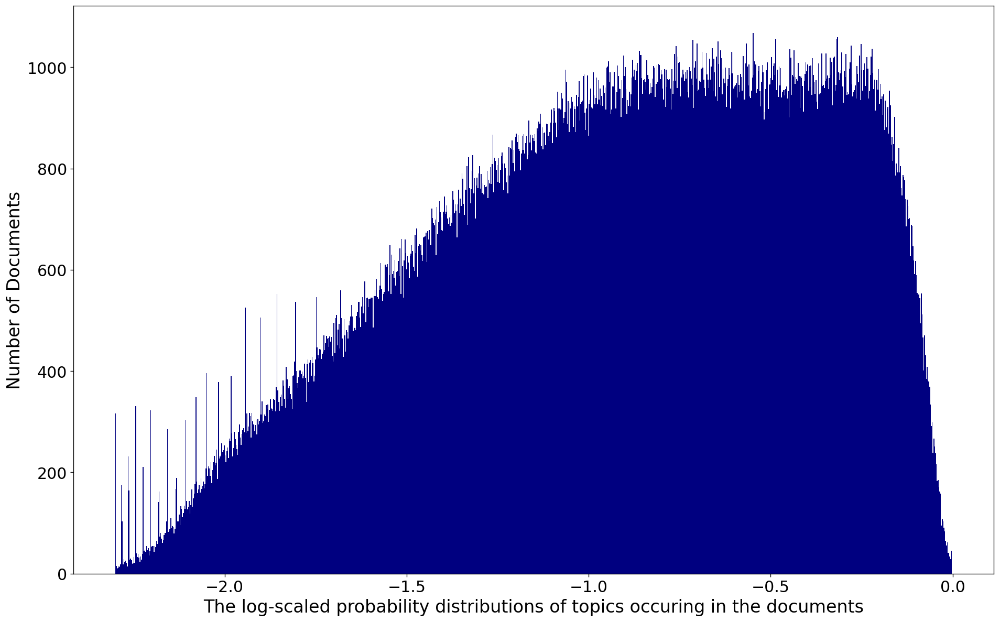

In [37]:
import seaborn as sns
inst = topics_infer_df.institution.unique().tolist()

# Plot
fig, ax1 = plt.subplots(1, 1, figsize=(16, 10), dpi=120, sharey=False)
fig.tight_layout()
fig.subplots_adjust(hspace = 0.4)

domin_topics_prob = [v for dist in list(topics_infer_df.topics) for v in list(dist.values())]
counts, bins, bars = ax1.hist(np.log10(domin_topics_prob), bins = 1000, color='navy')
# my_kde = sns.kdeplot(np.log10(domin_topics_prob), color="black", shade=False, shade_lowest = True, log_scale = False)
ax1.set_xlabel('The log-scaled probability distributions of topics occuring in the documents', fontsize = 20)
ax1.set_ylabel('Number of Documents', fontsize = 20)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)


fig.tight_layout()
fig.savefig('../project_latex/img/distri_doc_word_counts_test.pdf')
plt.show()

In [111]:
logged_prob = np.log10(domin_topics_prob)

In [115]:
np.min(logged_prob[(logged_prob > -3) & (logged_prob < -2)])

-2.3010218

In [116]:
10**(-2.3010218)

0.005000094356958864

In [29]:
ldamodel.minimum_probability = 0.005
# 0.005000094356958864

In [31]:
inst = topics_infer_df.institution.unique().tolist()
topics_infer_df_after_cut, topic_infer_list_after_cut = topics_infer(ldamodel=ldamodel, corpus=corpus, texts=data_ready)
topics_infer_df_after_cut.columns = ["topics", "text"]
topics_infer_df_after_cut = topics_infer_df_after_cut[["text", "topics"]]
topics_infer_df_after_cut['institution'] = df["institution"]

NameError: name 'topics_infer_df' is not defined

In [57]:
sum(topics_infer_df_after_cut.iat[5,1].values())

0.9944072254002094

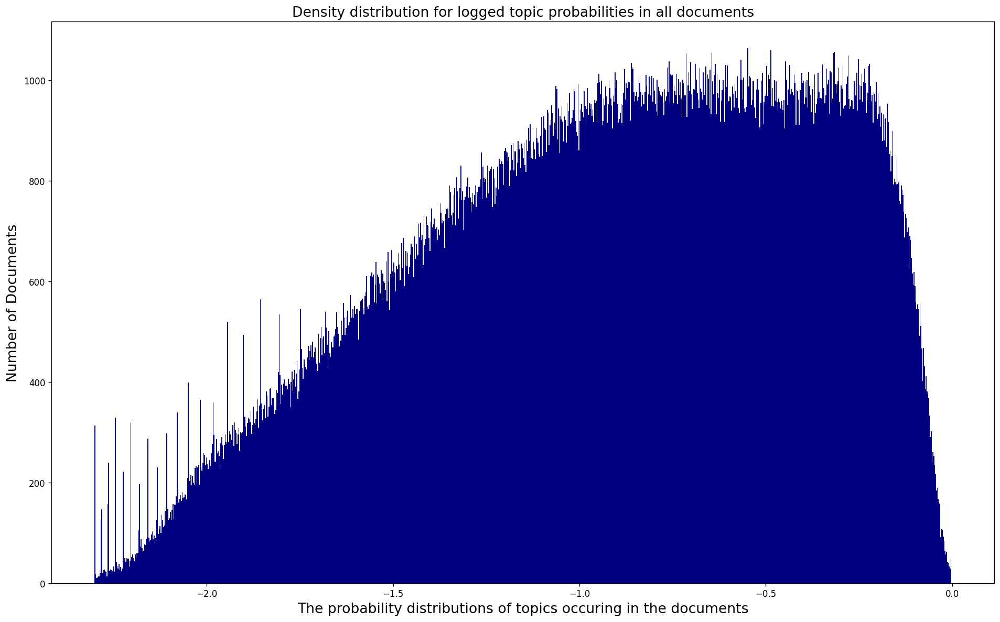

In [105]:
import seaborn as sns
inst = topics_infer_df_after_cut.institution.unique().tolist()

# Plot
fig, ax1 = plt.subplots(1, 1, figsize=(16, 10), dpi=120, sharey=False)
fig.tight_layout()
fig.subplots_adjust(hspace = 0.4)

domin_topics_prob = [v for dist in list(topics_infer_df_after_cut.topics) for v in list(dist.values())]
counts, bins, bars = ax1.hist(np.log10(domin_topics_prob), bins = 1000, color='navy')
# my_kde = sns.kdeplot(np.log(domin_topics_prob), color="black", ax = ax1.twinx(), shade=False, shade_lowest = True, log_scale = False)
ax1.set_xlabel('The probability distributions of topics occuring in the documents', fontsize = 16)
ax1.set_ylabel('Number of Documents', fontsize = 16)
# ax1.set_title('Density distribution for logged topic probabilities in all documents', fontdict=dict(size=16, color='black'))

fig.tight_layout()
fig.savefig('../project_latex/img/distri_doc_word_counts_after_cut2.pdf')
plt.show()

# 6. What is the Dominant topic and its percentage contribution in each document?

In LDA models, each document is composed of multiple topics. But, typically only one of the topics is dominant. The below code extracts this dominant topic for each sentence and shows the weight of the topic and the keywords in a nicely formatted output.

This way, you will know which document belongs predominantly to which topic

In [38]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(tqdm(ldamodel[corpus])):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

df_topic_sents_keywords = format_topics_sentences(ldamodel=ldamodel, corpus=corpus, texts=data_ready)

100%|███████████████████████████████████████████████████████████████████████████████████████████████| 145712/145712 [14:06<00:00, 172.19it/s]


In [39]:
# Format
df_dominant_topic = df_topic_sents_keywords.reset_index(drop = True)
df_dominant_topic.columns = ['Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic["Topic_Name"] = df_dominant_topic['Dominant_Topic'].apply(lambda num: themes[int(num)])

In [41]:
df_dominant_topic["Topic_Distribution"] = topics_infer_df["topics"]

In [42]:
df_with_predicted_topics = pd.concat([df, df_dominant_topic[["Dominant_Topic", "Topic_Perc_Contrib", "Keywords", "Topic_Name", "Topic_Distribution"]]], axis = 1)

In [43]:
# df_with_predicted_topics.head(50)

In [44]:
df_with_predicted_topics_final = pd.concat([df_with_predicted_topics.iloc[:,0:12], df_with_predicted_topics.iloc[:,-3:]], axis = 1)

In [45]:
df_with_predicted_topics_final

,title,abstract,aID,year,amount,institution,country,county,agency,sDate,eDate,data_ready,Keywords,Topic_Name,Topic_Distribution
0,Bioinspired Composites Strategies for Saving E...,Saving energy together with energy harvesting ...,948840,2021,1694375.0,AGH University of Science and Technology Krakow,Poland,Krakow,ERC,2021-01-01,2025-12-31,"[save, energi, energy_harvest, demand, power, ...","system, technolog, design, product, industri, ...",Computer System \n & Commercial Application,"{4: 0.61291337, 3: 0.33367592, 2: 0.029047627,..."
1,Pragmatics of Multiwinner Voting Algorithms a...,This proposal is in the area of computational ...,101002854,2021,1386290.0,AGH University of Science and Technology Krakow,Poland,Krakow,ERC,2021-06-01,2026-05-31,"[comput, social, choic, intersect, comput, sci...","system, technolog, design, product, industri, ...",Computer System \n & Commercial Application,"{4: 0.62183297, 6: 0.27510497, 0: 0.09436999}"
2,Exotic superconducting CIrcuits to Probe and p...,Quantum systems can occupy peculiar states suc...,851740,2020,1498875.0,ARMINES - Association for Research and Develop...,France,Paris,ERC,2020-03-01,2025-02-28,"[quantum, system, occupi, peculiar, state, sup...","materi, energi, properti, structur, imag, surf...",Material Science\n and Physics,"{3: 0.658641, 4: 0.283812, 1: 0.052689645}"
3,Quantum Feedback Engineering,Quantum technologies such as quantum computers...,884762,2020,2440125.0,ARMINES - Association for Research and Develop...,France,Paris,ERC,2020-12-01,2025-11-30,"[quantum, technolog, quantum_comput, simul, po...","system, technolog, design, product, industri, ...",Computer System \n & Commercial Application,"{4: 0.54690343, 3: 0.44784296}"
4,Artificial Enzyme Modules as Tools in a Tailor...,In order to tackle some of the prime societal ...,865885,2020,1995707.0,Aalto University,Finland,Aalto,ERC,2020-11-01,2025-10-31,"[order, tackl, prime, societ, challeng, centur...","system, technolog, design, product, industri, ...",Computer System \n & Commercial Application,"{4: 0.5048706, 2: 0.454653, 7: 0.03590474}"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145707,Mouse Models of Neurodegenerative Diseases Lab...,Neurodegeneration is defined by loss of specif...,MC_EX_MR/N501931/1,2017,1781285.0,MRC Mammalian Genetics Unit,UK,South East,UKRI,2017-01-01,2020-03-31,"[defin, loss, type, neuron, brain, spinal_cord...","diseas, patient, treatment, infect, drug, canc...",Cancer Treatment \n and Immunology,"{5: 0.4221574, 2: 0.28994873, 1: 0.2537917, 6:..."
145708,SCREENswitch Switchable Opacity Patient Isola...,Many people have been put into isolation in ho...,79146,2020,59884.0,Korn Wall Limited,UK,Unknown,UKRI,2020-10-01,2020-12-31,"[peopl, put, isol, hospit, covid, pandem, pers...","diseas, patient, treatment, infect, drug, canc...",Cancer Treatment \n and Immunology,"{5: 0.41352287, 4: 0.2964838, 6: 0.19940801, 3..."
145709,Virtual Cathode Deposition feasibility study f...,Increasing demand for small low cost powerful ...,132365,2016,104880.0,Plasma App Ltd.,UK,South East,UKRI,2016-07-01,2017-06-30,"[demand, low, cost, power, batteri, batteri, c...","system, technolog, design, product, industri, ...",Computer System \n & Commercial Application,"{4: 0.67799914, 3: 0.31261626}"
145710,Squidge amp Pip,Obtaining expert advice from a knowledgeable s...,752626,2015,5000.0,Lefendarty Limited,UK,Yorkshire and The Humber,UKRI,2015-08-01,2016-01-31,"[obtain, expert, advic, supplier, turn, innov,...","system, technolog, design, product, industri, ...",Computer System \n & Commercial Application,"{4: 0.65233934, 6: 0.23828848, 0: 0.090377964}"


# How does the topic distribute between different topics and agencies?

In [46]:
def split_topic_distribution(dic):
    """ split the topic distributions """
#     dic = df_with_predicted_topics_final.iat[1,-1]
    res = []
    for k in range(8):
        try:
            assert dic[k]
        except KeyError as msg:
            res.append(0)
        else:
            res.append(dic[k])
    return res[0], res[1], res[2], res[3], res[4], res[5], res[6], res[7]

In [47]:
df_with_predicted_topics_final['t0'], df_with_predicted_topics_final['t1'], df_with_predicted_topics_final['t2'], df_with_predicted_topics_final['t3'], df_with_predicted_topics_final['t4'], df_with_predicted_topics_final['t5'], df_with_predicted_topics_final['t6'], df_with_predicted_topics_final['t7'] = zip(*df_with_predicted_topics_final.Topic_Distribution.apply(split_topic_distribution))

In [48]:
df_with_predicted_topics_final

,title,abstract,aID,year,amount,institution,country,county,agency,sDate,...,Topic_Name,Topic_Distribution,t0,t1,t2,t3,t4,t5,t6,t7
0,Bioinspired Composites Strategies for Saving E...,Saving energy together with energy harvesting ...,948840,2021,1694375.0,AGH University of Science and Technology Krakow,Poland,Krakow,ERC,2021-01-01,...,Computer System \n & Commercial Application,"{4: 0.61291337, 3: 0.33367592, 2: 0.029047627,...",0.019595,0.000000,0.029048,0.333676,0.612913,0.000000,0.000000,0.000000
1,Pragmatics of Multiwinner Voting Algorithms a...,This proposal is in the area of computational ...,101002854,2021,1386290.0,AGH University of Science and Technology Krakow,Poland,Krakow,ERC,2021-06-01,...,Computer System \n & Commercial Application,"{4: 0.62183297, 6: 0.27510497, 0: 0.09436999}",0.094370,0.000000,0.000000,0.000000,0.621833,0.000000,0.275105,0.000000
2,Exotic superconducting CIrcuits to Probe and p...,Quantum systems can occupy peculiar states suc...,851740,2020,1498875.0,ARMINES - Association for Research and Develop...,France,Paris,ERC,2020-03-01,...,Material Science\n and Physics,"{3: 0.658641, 4: 0.283812, 1: 0.052689645}",0.000000,0.052690,0.000000,0.658641,0.283812,0.000000,0.000000,0.000000
3,Quantum Feedback Engineering,Quantum technologies such as quantum computers...,884762,2020,2440125.0,ARMINES - Association for Research and Develop...,France,Paris,ERC,2020-12-01,...,Computer System \n & Commercial Application,"{4: 0.54690343, 3: 0.44784296}",0.000000,0.000000,0.000000,0.447843,0.546903,0.000000,0.000000,0.000000
4,Artificial Enzyme Modules as Tools in a Tailor...,In order to tackle some of the prime societal ...,865885,2020,1995707.0,Aalto University,Finland,Aalto,ERC,2020-11-01,...,Computer System \n & Commercial Application,"{4: 0.5048706, 2: 0.454653, 7: 0.03590474}",0.000000,0.000000,0.454653,0.000000,0.504871,0.000000,0.000000,0.035905
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145707,Mouse Models of Neurodegenerative Diseases Lab...,Neurodegeneration is defined by loss of specif...,MC_EX_MR/N501931/1,2017,1781285.0,MRC Mammalian Genetics Unit,UK,South East,UKRI,2017-01-01,...,Cancer Treatment \n and Immunology,"{5: 0.4221574, 2: 0.28994873, 1: 0.2537917, 6:...",0.000000,0.253792,0.289949,0.000000,0.000000,0.422157,0.028772,0.000000
145708,SCREENswitch Switchable Opacity Patient Isola...,Many people have been put into isolation in ho...,79146,2020,59884.0,Korn Wall Limited,UK,Unknown,UKRI,2020-10-01,...,Cancer Treatment \n and Immunology,"{5: 0.41352287, 4: 0.2964838, 6: 0.19940801, 3...",0.000000,0.026688,0.000000,0.061175,0.296484,0.413523,0.199408,0.000000
145709,Virtual Cathode Deposition feasibility study f...,Increasing demand for small low cost powerful ...,132365,2016,104880.0,Plasma App Ltd.,UK,South East,UKRI,2016-07-01,...,Computer System \n & Commercial Application,"{4: 0.67799914, 3: 0.31261626}",0.000000,0.000000,0.000000,0.312616,0.677999,0.000000,0.000000,0.000000
145710,Squidge amp Pip,Obtaining expert advice from a knowledgeable s...,752626,2015,5000.0,Lefendarty Limited,UK,Yorkshire and The Humber,UKRI,2015-08-01,...,Computer System \n & Commercial Application,"{4: 0.65233934, 6: 0.23828848, 0: 0.090377964}",0.090378,0.000000,0.000000,0.000000,0.652339,0.000000,0.238288,0.000000


# Feature Engineering for SVM Prediction

In [49]:
df_ready = df_with_predicted_topics_final

In [50]:
df_ready["text_tokenized"] = df_with_predicted_topics["data_ready"]

In [51]:
df_ready = pd.concat([df_ready[["amount", "agency", "year", "project_duration"]], df_ready.iloc[:,15:26]], axis = 1)

KeyError: "['project_duration'] not in index"

In [52]:
df_ready = df_ready[["amount", "t0", "t1", "t2", "t3", "t4", "t5", "t6", "t7", "project_duration", "abs_word_count", "agency"]]

KeyError: "['project_duration', 'abs_word_count'] not in index"

In [55]:
def occurrence(probList):
    count = (probList != 0).tolist().count(1)
    return count / len(probList)

In [56]:
ERC_topics = df_with_predicted_topics_final.loc[df_with_predicted_topics_final.agency == 'ERC',]
UKRI_topics = df_with_predicted_topics_final.loc[df_with_predicted_topics_final.agency == 'UKRI',]
NIH_topics = df_with_predicted_topics_final.loc[df_with_predicted_topics_final.agency == 'NIH',]
NSF_topics = df_with_predicted_topics_final.loc[df_with_predicted_topics_final.agency == 'NSF',]

In [57]:
def log_prob(probLsit):
    mean_prob = probLsit.mean()
    return np.log10(mean_prob) if mean_prob != 0 else None

In [58]:
def get_heatmap_matrix_with_topics(data, groupby, func = log_prob, themes = None):
    heatmap_df_with_topics = data.groupby(groupby).agg({"t0": func, 
                                      "t1": func, 
                                      "t2": func, 
                                      "t3": func,
                                      "t4": func, 
                                      "t5": func, 
                                      "t6": func, 
                                      "t7": func})
    if themes:
        heatmap_df_with_topics.columns = [elem for elem in themes]
    else:
        heatmap_df_with_topics.columns = ["Topic 0", "Topic 1", "Topic 2", "Topic 3", "Topic 4", "Topic 5", "Topic 6", "Topic 7"]
    return heatmap_df_with_topics

In [59]:
freq_agency_topics = get_heatmap_matrix_with_topics(df_with_predicted_topics_final, 'agency', occurrence, themes = themes)

In [60]:
agency_topics_prob_matrix = get_heatmap_matrix_with_topics(df_with_predicted_topics_final, "agency", themes = themes)
agency_topics_prob_matrix

,Higher Education,Brain Science,Protein Chemistry \n and Microbiology,Material Science\n and Physics,Computer System \n & Commercial Application,Cancer Treatment \n and Immunology,Social Policy \n and Public Healthcare,Climate Change \n and Environment
agency,,,,,,,,
ERC,-1.388100,-1.076914,-0.843404,-0.710075,-0.608736,-1.008445,-0.971969,-1.089448
NIH,-1.111769,-0.778421,-0.689483,-1.483080,-1.243212,-0.526318,-0.917654,-1.395343
NSF,-0.604874,-1.430363,-1.213463,-0.779877,-0.559005,-1.584348,-1.092267,-0.995234
UKRI,-1.047769,-1.317299,-1.148084,-0.905246,-0.538962,-0.964372,-0.732471,-1.096845


In [62]:
def get_themes(themeList):
    for theme in themeList:
        print(themes[theme])
    return None

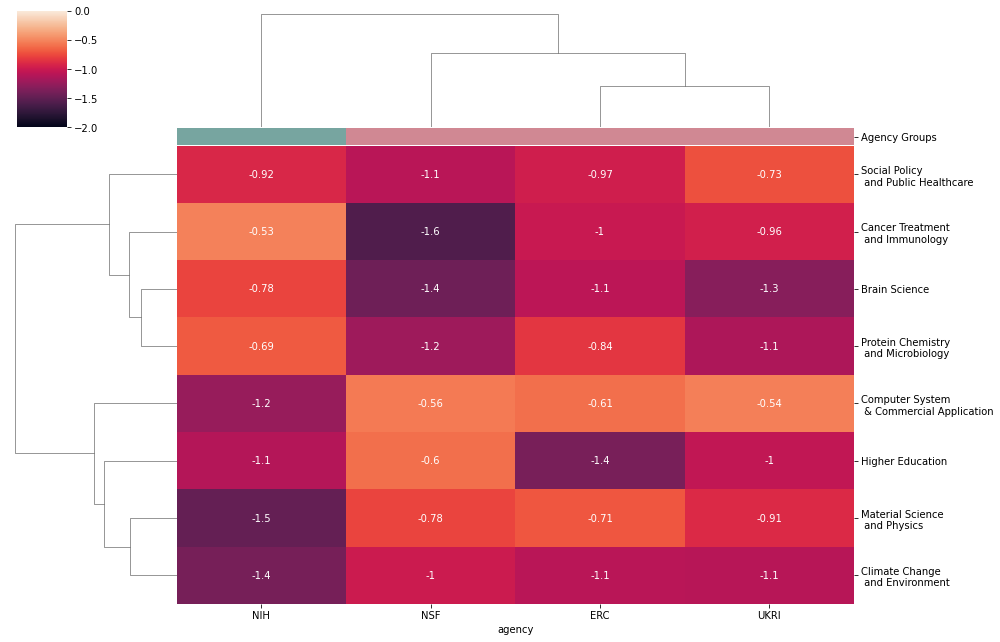

In [63]:
network_pal = sns.husl_palette(2, s=.45)
groups = pd.Series(["STEM-focused", "Health-focused", "STEM-focused", "STEM-focused"], index = agency_topics_prob_matrix.index)
groups.name = 'Agency Groups'
lut = dict(zip(groups.unique(), network_pal))
col_colors = pd.Series(groups, index=agency_topics_prob_matrix.index).map(lut)
sns.clustermap(agency_topics_prob_matrix.T, vmin = -2, vmax = 0, annot=True, figsize=(14,9), metric="euclidean", method="ward", row_cluster=True, col_colors=col_colors)
plt.savefig('../project_latex/img/heatmap_agency_topicsdd.pdf', dpi = 160)
plt.show()

In [64]:
import requests
  
class Currency_convertor:
    # empty dict to store the conversion rates
    rates = {} 
    def __init__(self, url):
        data = requests.get(url).json()
  
        # Extracting only the rates from the json data
        self.rates = data["rates"] 
  
    # function to do a simple cross multiplication between 
    # the amount and the conversion rates
    def convert(self, from_currency, to_currency, amount, verbose = False):
        initial_amount = amount
        if from_currency != 'EUR' :
            amount = amount / self.rates[from_currency]
  
        # limiting the precision to 2 decimal places
        amount = round(amount * self.rates[to_currency], 2)
        if verbose:
            print('{} {} = {} {}'.format(initial_amount, from_currency, amount, to_currency))
        return amount

In [65]:
YOUR_ACCESS_KEY = '3c4438207f1f9a1844a4272f5667f760'
url = str.__add__('http://data.fixer.io/api/latest?access_key=', YOUR_ACCESS_KEY)  
c = Currency_convertor(url)

In [66]:
# Convert EUR to USD
ERC_topics.amount = ERC_topics.amount.apply(lambda v: c.convert("EUR", "USD", v))

In [67]:
# Convert GBP to USD
UKRI_topics.amount = UKRI_topics.amount.apply(lambda v: c.convert('GBP', 'USD', v))

In [68]:
ERC_topics["sDate"] = pd.to_datetime(ERC_topics['sDate'], dayfirst = True)
ERC_topics["eDate"] = pd.to_datetime(ERC_topics['eDate'], dayfirst = True)
UKRI_topics["sDate"] = pd.to_datetime(UKRI_topics['sDate'], dayfirst = True)
UKRI_topics["eDate"] = pd.to_datetime(UKRI_topics['eDate'], dayfirst = True)
NIH_topics["sDate"] = pd.to_datetime(NIH_topics['sDate'])
NIH_topics["eDate"] = pd.to_datetime(NIH_topics['eDate'])
NSF_topics["sDate"] = pd.to_datetime(NSF_topics['sDate'])
NSF_topics["eDate"] = pd.to_datetime(NSF_topics['eDate'])

In [69]:
df_with_predicted_topics_after_unified_currency = pd.concat([ERC_topics, UKRI_topics, NIH_topics, NSF_topics])

In [70]:
df_with_predicted_topics_after_unified_currency['project_duration'] = (df_with_predicted_topics_after_unified_currency.eDate - df_with_predicted_topics_after_unified_currency.sDate).astype('timedelta64[D]')

In [71]:
df_with_predicted_topics_after_unified_currency = df_with_predicted_topics_after_unified_currency[df_with_predicted_topics_after_unified_currency.project_duration > 0]

In [72]:
df_with_predicted_topics_after_unified_currency

,title,abstract,aID,year,amount,institution,country,county,agency,sDate,...,t0,t1,t2,t3,t4,t5,t6,t7,text_tokenized,project_duration
0,Bioinspired Composites Strategies for Saving E...,Saving energy together with energy harvesting ...,948840,2021,1994550.47,AGH University of Science and Technology Krakow,Poland,Krakow,ERC,2021-01-01,...,0.019595,0.000000,0.029048,0.333676,0.612913,0.0,0.000000,0.000000,"[save, energi, energy_harvest, demand, power, ...",1825.0
1,Pragmatics of Multiwinner Voting Algorithms a...,This proposal is in the area of computational ...,101002854,2021,1631885.14,AGH University of Science and Technology Krakow,Poland,Krakow,ERC,2021-06-01,...,0.094370,0.000000,0.000000,0.000000,0.621833,0.0,0.275105,0.000000,"[comput, social, choic, intersect, comput, sci...",1825.0
2,Exotic superconducting CIrcuits to Probe and p...,Quantum systems can occupy peculiar states suc...,851740,2020,1764415.70,ARMINES - Association for Research and Develop...,France,Paris,ERC,2020-03-01,...,0.000000,0.052690,0.000000,0.658641,0.283812,0.0,0.000000,0.000000,"[quantum, system, occupi, peculiar, state, sup...",1825.0
3,Quantum Feedback Engineering,Quantum technologies such as quantum computers...,884762,2020,2872417.54,ARMINES - Association for Research and Develop...,France,Paris,ERC,2020-12-01,...,0.000000,0.000000,0.000000,0.447843,0.546903,0.0,0.000000,0.000000,"[quantum, technolog, quantum_comput, simul, po...",1825.0
4,Artificial Enzyme Modules as Tools in a Tailor...,In order to tackle some of the prime societal ...,865885,2020,2349266.45,Aalto University,Finland,Aalto,ERC,2020-11-01,...,0.000000,0.000000,0.454653,0.000000,0.504871,0.0,0.000000,0.035905,"[order, tackl, prime, societ, challeng, centur...",1825.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118741,ELT Collaborative Research Causes and effects ...,The endPermian mass extinction EPME was the mo...,1636625,2016,400157.00,University of Nebraska-Lincoln,US,Nebraska,NSF,2016-09-01,...,0.093575,0.000000,0.000000,0.066202,0.000000,0.0,0.177589,0.656291,"[endpermian, mass, extinct, epm, biotic, crisi...",1825.0
118742,FRG Collaborative Research Trisections New ...,Topology is the study of spaces in a broad sen...,1664605,2017,63952.00,University of California-Berkeley,US,California,NSF,2017-07-01,...,0.092258,0.046046,0.000000,0.185940,0.671613,0.0,0.000000,0.000000,"[topolog, space, broad, sens, space, fourdimen...",1460.0
118743,The Origin of Abiotic Hydrocarbons in Seafloor...,The origin and synthesis of higher chain hydro...,1634032,2016,398731.00,Woods Hole Oceanographic Institution,US,Massachusetts,NSF,2016-09-01,...,0.205574,0.000000,0.180249,0.292113,0.058568,0.0,0.027190,0.234740,"[origin, synthesi, higher, chain, hydrocarbon,...",1094.0
118744,Radiation and Transport in QCD Matter,A few microseconds after the Big Bang the univ...,1614484,2016,439118.00,Texas AM University,US,Texas,NSF,2016-07-01,...,0.108331,0.000000,0.000000,0.717238,0.169539,0.0,0.000000,0.000000,"[microsecond, bang, univers, fill, extrem, hot...",1460.0


In [73]:
medicine_specialist = df_with_predicted_topics_after_unified_currency[df_with_predicted_topics_after_unified_currency.agency == 'NIH']
medicine_specialist.reset_index(drop = True, inplace = True)
medicine_specialist["catagorical_funding"] = pd.qcut(medicine_specialist.amount, 3, [0,1,2])
medicine_specialist.to_csv("../Data/medicine_specialist.csv", index = False)

In [74]:
non_medicine_generalist = df_with_predicted_topics_after_unified_currency[df_with_predicted_topics_after_unified_currency.agency != 'NIH']
non_medicine_generalist.reset_index(drop = True, inplace = True)
non_medicine_generalist["catagorical_funding"] = pd.qcut(non_medicine_generalist.amount, 3, [0,1,2])
non_medicine_generalist.to_csv("../Data/non_medicine_generalist.csv", index = False)

In [75]:
ff = medicine_specialist[['t0', 't1', 't2', 't3', 't4', 't5', 't6', 't7', 'project_duration']]

In [76]:
dd = non_medicine_generalist[['t0', 't1', 't2', 't3', 't4', 't5', 't6', 't7', 'project_duration']]

In [78]:
from sklearn.preprocessing import StandardScaler
sc_1=StandardScaler()
sc_1.fit(ff)
ff=pd.DataFrame(sc_1.fit_transform(ff))
ff.columns = ['t0', 't1', 't2', 't3', 't4', 't5', 't6', 't7', 'project_duration']
ff['catagorical_funding'] = medicine_specialist['catagorical_funding']
ff['amount'] = medicine_specialist['amount']

In [79]:
from sklearn.preprocessing import StandardScaler
sc_1=StandardScaler()
sc_1.fit(ff)
dd=pd.DataFrame(sc_1.fit_transform(dd))
dd.columns = ['t0', 't1', 't2', 't3', 't4', 't5', 't6', 't7', 'project_duration']
dd['catagorical_funding'] = non_medicine_generalist['catagorical_funding']
dd['amount'] = non_medicine_generalist['amount']

In [80]:
dd.to_csv("../Data/nmg.csv", index = False)

In [81]:
ff.to_csv("../Data/medicine.csv", index = False)

In [82]:
def dicretise(continous_data = df_with_predicted_topics_after_unified_currency.amount.tolist(), num_bins = 10):
    bins = np.linspace(0,1,num_bins + 1)
    bins = [round(np.quantile(continous_data, q=num), 2) for num in bins]
    res = []
    ranges = []
    for amount in continous_data:
        for idx in range(num_bins + 1):
            if idx < num_bins:
#                 ranges.append("{}~{}".format(bins[idx], bins[idx + 1]))
                ranges.append("{}".format(bins[idx + 1]))
            if idx < num_bins-1:
                if amount >= bins[idx] and amount < bins[idx + 1]:
                    res.append(idx)
                else:
                    continue
            elif idx >= num_bins - 1 and idx < num_bins:
                if amount >= bins[idx] and amount <= bins[idx + 1]:
                    res.append(idx)
                else:
                    continue
            elif idx == (num_bins):
                continue
    return ranges[:num_bins], res

In [83]:
def get_distribution(df, standard_scale = False, colname = 'amount'):
    amount = np.array(df[colname])
    amount = amount.reshape(-1,1)
#     min_max_scaler = StandardScaler()
#     scaled_amount = min_max_scaler.fit_transform(amount)
    plt.figure(figsize=(16, 10))
    if standard_scale:
        plt.scatter(range(0, len(scaled_amount)), scaled_amount)
    else:
        plt.scatter(range(0, len(amount)), amount)

In [84]:
# Cut outliers
ms_cut = medicine_specialist.loc[medicine_specialist.amount <= 1e7,]
nmg_cut = non_medicine_generalist.loc[non_medicine_generalist.amount <= 1e7,]
print(ms_cut.shape)
print(nmg_cut.shape)

(70854, 26)
(74212, 26)


In [89]:
df = pd.concat([ms_cut, nmg_cut])
df.reset_index(drop = True, inplace = True)
df['ratio'] = df['amount']/df['project_duration']
df = df.loc[(df.ratio <= 10000),]
df.reset_index(drop = True, inplace = True)
df_cut = df[['t0', 't1', 't2', 't3', 't4', 't5', 't6', 't7', 'amount', 'project_duration', 'agency']]
df_cut['daily_amount'] = df_cut['amount']/df_cut['project_duration']
df_nih = df_cut[df_cut.agency == 'NIH'][['t0', 't1', 't2', 't3', 't4', 't5', 't6', 't7', 'project_duration', 'daily_amount']]
df_other = df_cut[df_cut.agency != 'NIH'][['t0', 't1', 't2', 't3', 't4', 't5', 't6', 't7', 'project_duration',  'daily_amount']]
df_cut['target'] = pd.qcut(df_cut['amount'], 3, [0,1,2])
df_nih['target'] = pd.qcut(df_nih['daily_amount'], 3, [0,1,2])
df_other['target'] = pd.qcut(df_other['daily_amount'], 3, [0,1,2])
df_nih.to_csv('../Data/df_nih1.csv', index = False)
df_other.to_csv('../Data/df_other1.csv', index = False)
df_cut.to_csv('../Data/df_gbm1.csv', index = False)

In [90]:
ms_cut_discrete = df[(df.agency == 'NIH') & (df.ratio != 0)]
nmg_cut_discrete = df[(df.agency != 'NIH') & (df.ratio != 0)]

In [91]:
import seaborn as sns; sns.set(color_codes=True)
import matplotlib.pyplot as plt
import matplotlib.gridspec
def get_amount_topics(df = nmg_cut_discrete, ylabel = False, name = 'nmg'):
    df_amount_topics = get_heatmap_matrix_with_topics(df, 'discrete_ratio2', themes = themes)
    network_pal = sns.husl_palette(3, s=.9)
    groups = pd.qcut(pd.Series(np.float64(df_amount_topics.index.tolist())), 3, ["low-range", "medium-range", "high-range"])
    groups.name = 'Funding Ranges'
    lut = dict(zip(groups.unique(), network_pal))
    row_colors = pd.Series(groups.tolist(), index = df_amount_topics.index).map(lut)
    g = sns.clustermap(df_amount_topics, vmin=-2, vmax=0, annot = False, col_cluster=True, metric="euclidean", 
                        figsize=(10,20), method="ward", row_cluster=False, yticklabels=True, row_colors=row_colors)
    
    plt.setp(g.ax_heatmap.xaxis.get_majorticklabels(), rotation=75, fontsize = 12)
    
    if ylabel == False:
        try:
            plt.setp(g.ax_heatmap.get_yaxis().set_visible(False))
        except:
            pass
    
    plt.savefig('../project_latex/img/heatmap_{}_amount_topics.pdf'.format(name), dpi = 600)
    plt.show()
    return df_amount_topics.reset_index(drop = False)

In [92]:
nmg = get_amount_topics(nmg_cut_discrete, False , 'nmg222')

KeyError: 'discrete_ratio2'

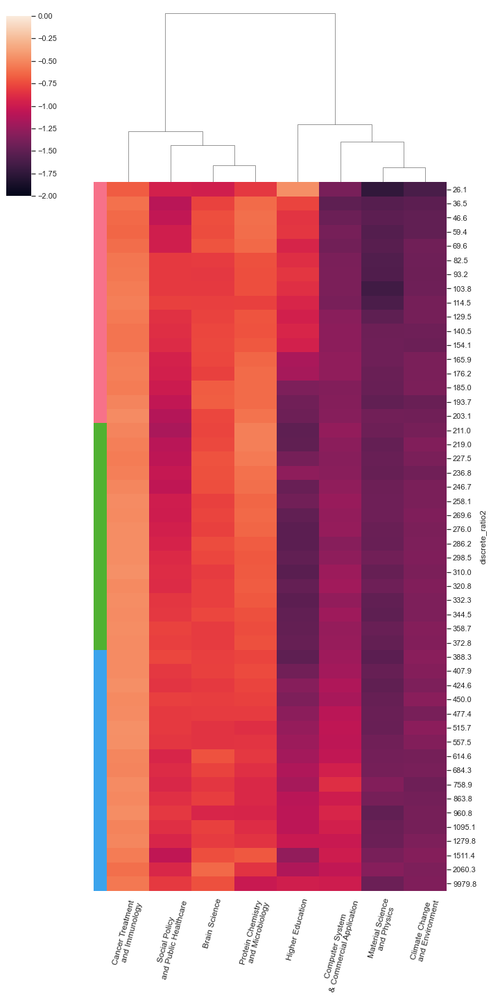

In [884]:
md = get_amount_topics(ms_cut_discrete, True, "medicine")

In [609]:
# import seaborn as sns
# # fig, ax1 = plt.subplots(1, 1, figsize=(10, 8), dpi=160, sharey=False)
# # sns.heatmap(ERC_country_topics, vmin = 0, vmax = -5, annot=True)
# sns.clustermap(NIH_country_topics, metric="euclidean", method="ward", figsize=(18,18), vmin=-5, vmax=0, annot = True)
# # plt.title('Heatmap between countries and topics in ERC dataset', fontdict=dict(size=13, color='black'))
# plt.savefig('../project_latex/img/heatmap_NIH_country_topics.pdf')
# plt.show()

In [ ]:
# import seaborn as sns
# # fig, ax1 = plt.subplots(1, 1, figsize=(10, 8), dpi=160, sharey=False)
# # sns.heatmap(ERC_country_topics, vmin = 0, vmax = -5, annot=True)
# sns.clustermap(NSF_country_topics, metric="euclidean", method="ward", figsize=(18,18), vmin=-5, vmax=0, annot = True)
# # plt.title('Heatmap between countries and topics in ERC dataset', fontdict=dict(size=13, color='black'))
# plt.savefig('../project_latex/img/heatmap_NSF_country_topics.pdf')
# plt.show()

In [ ]:
# NSF_year_topics

In [ ]:
# import seaborn as sns
# # fig, ax1 = plt.subplots(1, 1, figsize=(10, 8), dpi=160, sharey=False)
# # sns.heatmap(ERC_country_topics, vmin = 0, vmax = -5, annot=True)
# sns.clustermap(NSF_year_topics.T, metric="euclidean", method="ward", figsize=(18,18), vmin=-5, vmax=0, annot = True, col_cluster=False)
# # plt.title('Heatmap between countries and topics in ERC dataset', fontdict=dict(size=13, color='black'))
# plt.savefig('../project_latex/img/heatmap_UKRI_country_topics.pdf')
# plt.show()

# 7. The most representative sentence for each topic

Sometimes you want to get samples of sentences that most represent a given topic. This code gets the most exemplar sentence for each topic.

In [171]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]
sent_topics_sorteddf_mallet["Topic_Name"] = sent_topics_sorteddf_mallet['Topic_Num'].apply(lambda num: themes[int(num)])

In [173]:
# Show
sent_topics_sorteddf_mallet.head()

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text,Topic_Name
0,0.0,0.9924,"scienc, univers, commun, educ, collabor, school, activ, engag, learn, nation","[spire, seed, postdoctor, innov, educ, postdoctor, career, built, partnership, unc_chapel_hil, p...",Higher Education
1,1.0,0.9951,"brain, human, activ, neuron, age, behaviour, memori, signal, process, anim","[target, therapi, exist, treatment, autism_spectrum, disord, asd, mechan, understood, implic, ce...",Brain Science
2,2.0,0.9936,"protein, gene, molecul, biolog, molecular, process, structur, regul, mechan, dna","[cellular, life, depend, time, accur, duplic, chromosom, dna, semi, conserv, replic, sustain, ge...",Protein Chemistry and Microbiology
3,3.0,0.9931,"materi, energi, properti, structur, imag, surfac, process, physic, light, quantum","[ultim, devic, miniatur, reli, singl, charg, singl, dopant, atom, solotron, gate, length, transi...",Material Science and Physic
4,4.0,0.9947,"system, technolog, design, product, industri, process, comput, cost, manufactur, gener","[mathemat, optim, equilibrium, problem, promin, machine_learn, statist, economi, busi, health, c...",Computer System and Commercial Application


In [174]:
" ".join(sent_topics_sorteddf_mallet.iat[4,3])

'mathemat optim equilibrium problem promin machine_learn statist economi busi health care branch scienc engin solv problem gain natur structur complex system design control system effici scarc resourc numer paramet formul problem case exact paramet complet inform paramet event effect manag longterm behavior complex system uncertainti introduc probability_distribut paramet expect problem formul numer solv problem expect type approxim commonli properti optim equilibrium problem defin expect problem approxim solv interest idea electr market competit renew nonrenew energi sourc result evalu wellposed problem reliabl solut obtain numer procedur solv type problem analyz structur properti optim equilibrium problem defin expect infer procedur samplingbas optim electr market effici infer solut true optim equilibrium problem solut sampl averag approxim saa problem expect gener framework saa nonsmooth saa solut inexact saa asymptot distribut piecewis structur case gener constrain optim problem ou

# 8. Frequency Distribution of Word Counts in Documents

When working with a large number of documents, you want to know how big the documents are as a whole and by topic. Let’s plot the document word counts distribution.

In [175]:
def remove_long_text(data, numWords=5):
    col = data['Text'].apply(lambda s: True if len(s) < numWords else False).tolist()
    data = data[data.index.isin([i for i, x in enumerate(col) if x])]
    data.reset_index(drop = True, inplace = True)
    return data

In [176]:
%%time
inst = df_dominant_topic.institution.unique().tolist()

# Plot
fig, axes = plt.subplots(2, 2, figsize=(16, 15), dpi=120, sharey=False)
fig.tight_layout()
fig.subplots_adjust(hspace = 0.4)

for i, ax in enumerate(axes.flatten()):
    if inst[i] == 'ERC':
        doc_lens = [len(d) for d in remove_long_text(df_dominant_topic.loc[df_dominant_topic.institution == inst[i], ].reset_index(drop = True), numWords=200).Text]
    else: 
        doc_lens = [len(d) for d in remove_long_text(df_dominant_topic.loc[df_dominant_topic.institution == inst[i], ].reset_index(drop = True), numWords=400).Text]

    # Plot
#     ax.figure(figsize=(16,7), dpi=160)
    ax.hist(doc_lens, bins = 700, color='black')
    sns.kdeplot(doc_lens, color="black", shade=False, ax=ax.twinx())
    ax.text(max(doc_lens)*0.9, 175, "Mean   : " + str(round(np.mean(doc_lens))))
    ax.text(max(doc_lens)*0.9, 160, "Median : " + str(round(np.median(doc_lens))))
    ax.text(max(doc_lens)*0.9, 145, "Stdev   : " + str(round(np.std(doc_lens))))
    ax.text(max(doc_lens)*0.9, 130, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
    ax.text(max(doc_lens)*0.9, 115, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))
    ax.set_title('Distribution of Document Word Counts for {} Dataset'.format(inst[i]), fontdict=dict(size=16, color='black'))

#     ax.gca().set(xlim=(0, 500), ylabel='Number of Documents', xlabel='Document Word Count')
    ax.tick_params(size=16)

fig.tight_layout()
# plt.xticks(np.linspace(0,500,9))
# fig.suptitle('Distribution of Document Word Counts', fontdict=dict(size=22))
# fig.savefig('../Results/distri_doc_word_counts.pdf')
plt.show()

AttributeError: 'DataFrame' object has no attribute 'institution'

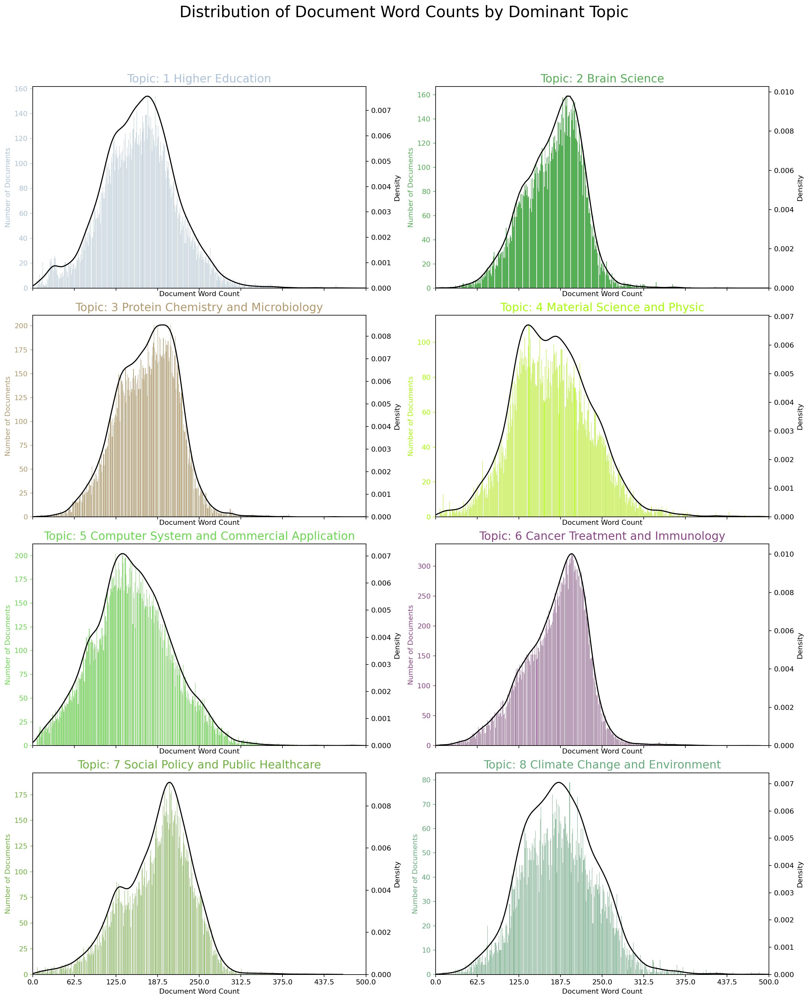

CPU times: user 25.5 s, sys: 906 ms, total: 26.5 s
Wall time: 18.1 s


In [178]:
%%time
import seaborn as sns
import matplotlib.colors as mcolors
colors = list(mcolors.XKCD_COLORS.items())
del colors[7]
del colors[9]
del colors[10]
cols = [color for name, color in colors]  # more colors: 'mcolors.XKCD_COLORS'


fig, axes = plt.subplots(4,2,figsize=(16,20), dpi=160, sharex=True, sharey=False)

for i, ax in enumerate(axes.flatten()):    
    df_dominant_topic_sub = df_dominant_topic.loc[df_dominant_topic.Dominant_Topic == i, :]
    doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
    ax.hist(doc_lens, bins = 1000, color=cols[i])
    ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
    sns.kdeplot(doc_lens, color="black", shade=False, ax=ax.twinx())
    ax.set(xlim=(0, 500), xlabel='Document Word Count')
    ax.set_ylabel('Number of Documents', color=cols[i])
    ax.set_title('Topic: '+str(i+1) + " " + themes[i], fontdict=dict(size=16, color=cols[i]))

fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.xticks(np.linspace(0,500,9))
fig.suptitle('Distribution of Document Word Counts by Dominant Topic', fontsize=22)
fig.savefig('../project_latex/img/distr_doc_word_counts_by_dominant_topic.pdf')
plt.show()

# 9. Word Clouds of Top N Keywords in Each Topic

Though you’ve already seen what are the topic keywords in each topic, a word cloud with the size of the words proportional to the weight is a pleasant sight. The coloring of the topics I’ve taken here is followed in the subsequent plots as well.

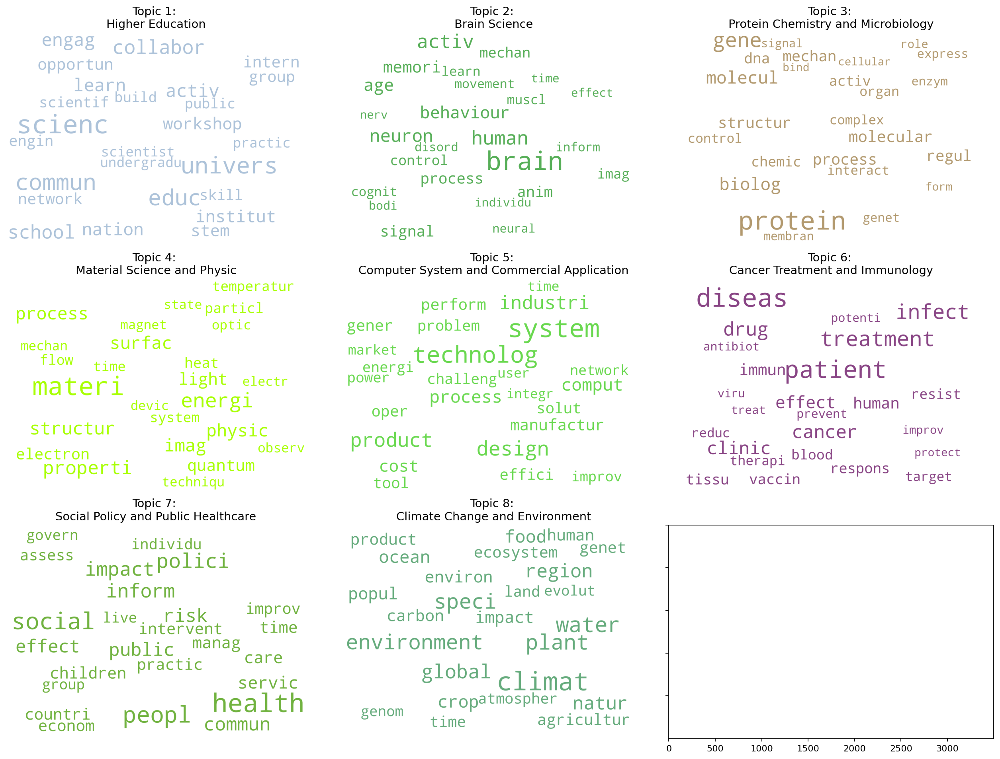

CPU times: user 27.7 s, sys: 5.2 s, total: 32.9 s
Wall time: 32.8 s


In [182]:
%%time
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

colors = list(mcolors.XKCD_COLORS.items())
del colors[7]
del colors[9]
del colors[10]
cols = [color for name, color in colors]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=3500,
                  height=2500,
                  max_words=25,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = ldamodel.show_topics(25, 25, formatted=False)

fig, axes = plt.subplots(3, 3, figsize=(16,12), dpi = 160, 
                         sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    if i > 7:
        break
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i+1) + ": " + '\n' + themes[i], fontdict=dict(size=13))
    plt.gca().axis('off')

# plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
fig.savefig('../project_latex/img/keywords_word_cloud.pdf')
plt.show()

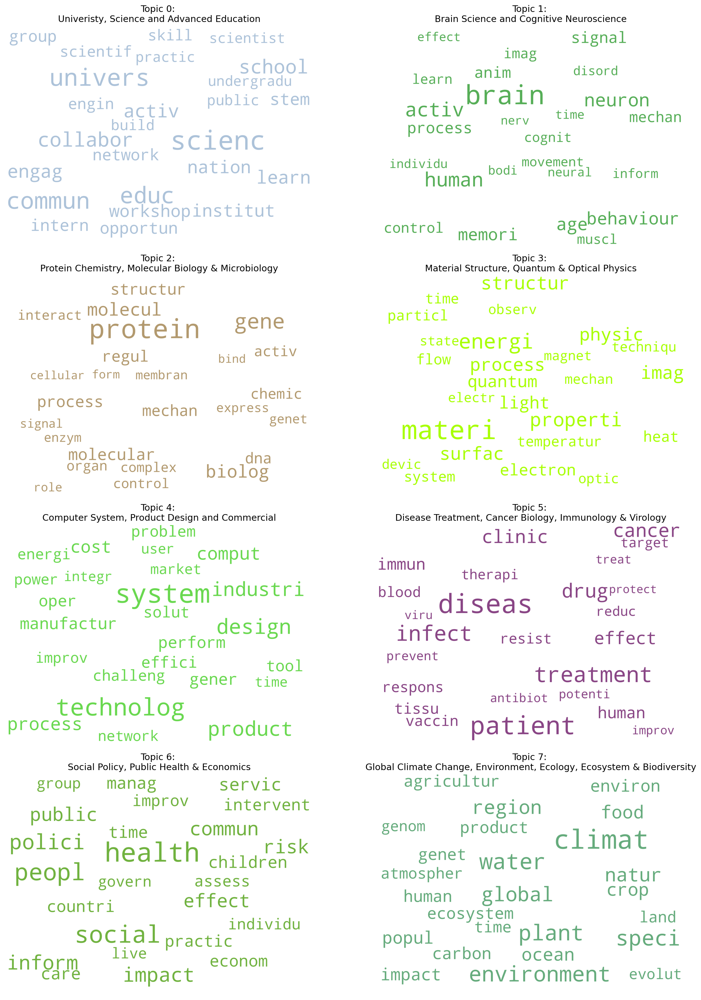

CPU times: user 26.3 s, sys: 4.93 s, total: 31.2 s
Wall time: 31.4 s


In [215]:
%%time
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

colors = list(mcolors.XKCD_COLORS.items())
del colors[7]
del colors[9]
del colors[10]
cols = [color for name, color in colors]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=3500,
                  height=2500,
                  max_words=25,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = ldamodel.show_topics(25, 25, formatted=False)

fig, axes = plt.subplots(4, 2, figsize=(16,20), dpi = 160, 
                         sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i) + ": " + '\n' + themes[i], fontdict=dict(size=13))
    plt.gca().axis('off')

# plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
fig.savefig('../project_latex/img/keywords_word_cloud_all.pdf')
plt.show()

# 10. Word Counts of Topic Keywords

When it comes to the keywords in the topics, the importance (weights) of the keywords matters. Along with that, how frequently the words have appeared in the documents is also interesting to look.

Let’s plot the word counts and the weights of each keyword in the same chart.

You want to keep an eye out on the words that occur in multiple topics and the ones whose relative frequency is more than the weight. Often such words turn out to be less important. The chart I’ve drawn below is a result of adding several such words to the stop words list in the beginning and re-running the training process.

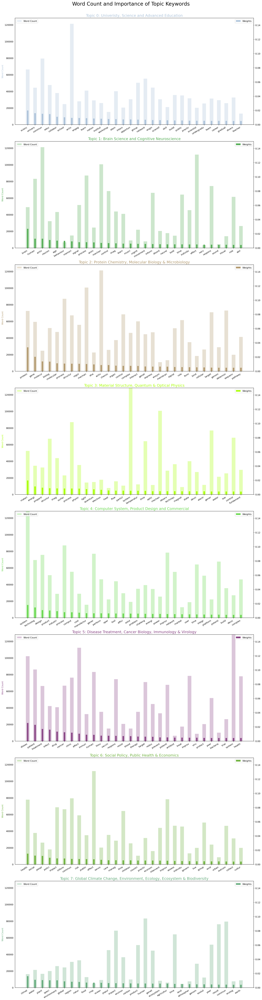

CPU times: user 12.7 s, sys: 2.25 s, total: 15 s
Wall time: 15 s


In [217]:
%%time
from collections import Counter
topics = ldamodel.show_topics(20, 30, formatted=False)
data_flat = [w for w_list in data_ready for w in w_list]
counter = Counter(data_flat)

out = []
wc = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])
        wc.append(counter[word])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(8, 1, figsize=(16,60), sharey=True, dpi=160)
colors = list(mcolors.XKCD_COLORS.items())
del colors[7]
del colors[9]
del colors[10]
cols = [color for name, color in colors]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.15); ax.set_ylim(0, max(wc))
    ax.set_title('Topic ' + str(i) + ': ' + themes[i], color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.01)    
fig.savefig('../project_latex/img/word_count_and_importance_of_topic_keywords.pdf')
plt.show()

# 11. Sentence Chart Colored by Topic

Each word in the document is representative of one of the 4 topics. Let’s color each word in the given documents by the topic id it is attributed to.
The color of the enclosing rectangle is the topic assigned to the document.

In [79]:
ldamodel.per_word_topics = True

In [424]:
# Sentence Coloring of N Sentences
from matplotlib.patches import Rectangle

def sentences_chart(lda_model=ldamodel, corpus=corpus, start = 0, end = 13):
    corp = corpus[start:end]
    colors = list(mcolors.XKCD_COLORS.items())
    del colors[7]
    del colors[9]
    del colors[10]
    mycolors = [color for name, color in colors]

    fig, axes = plt.subplots(end-start, 1, figsize=(30, (end-start)*1), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(tqdm(axes)):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = [(lda_model.id2word[wd], topic[0] if len(topic) != 0 else None) for wd, topic in wordid_topics] 
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.0), 1, 0.99, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))
            ax.text(0.01, 0.0, themes[topic_percs_sorted[0][0]], verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 17:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .007 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '......',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)       

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y = 0.98, fontweight=700)
    plt.tight_layout()
    plt.savefig("../project_latex/img/sentences.pdf", dpi = 160)
    plt.show()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 172.75it/s]


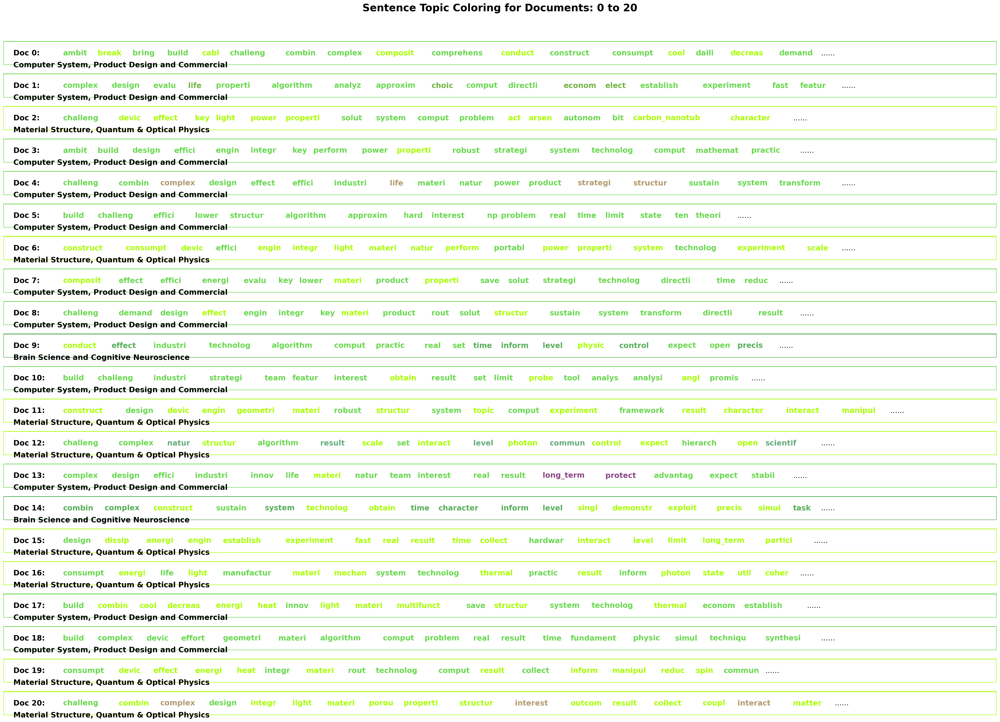

CPU times: user 4.54 s, sys: 231 ms, total: 4.77 s
Wall time: 4.43 s


In [425]:
%%time
sentences_chart(start = 0, end = 22)

# 12. What are the most discussed topics in the documents?

Let’s make two plots:

- The number of documents for each topic by assigning the document to the topic that has the most weight in that document.
- The number of documents for each topic by by summing up the actual weight contribution of each topic to respective documents.

## First Plot: The number of documents for each topic by assigning the document to the topic that has the most weight in that document.

In [84]:
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(tqdm(corpus_sel)):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

In [85]:
dominant_topics, topic_percentages = topics_per_document(model=ldamodel, corpus=corpus, end=-1)

100%|███████████████████████████████████████████████████████████████████████████████████████████████| 146251/146251 [04:14<00:00, 574.88it/s]


In [103]:
# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
df['inst'] = df_dominant_topic["institution"]
dominant_topic_in_each_doc = df.groupby(['Dominant_Topic', 'inst']).size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in ldamodel.show_topics(20, 30,formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)

## Second Plot: The number of documents for each topic by by summing up the actual weight contribution of each topic to respective documents.

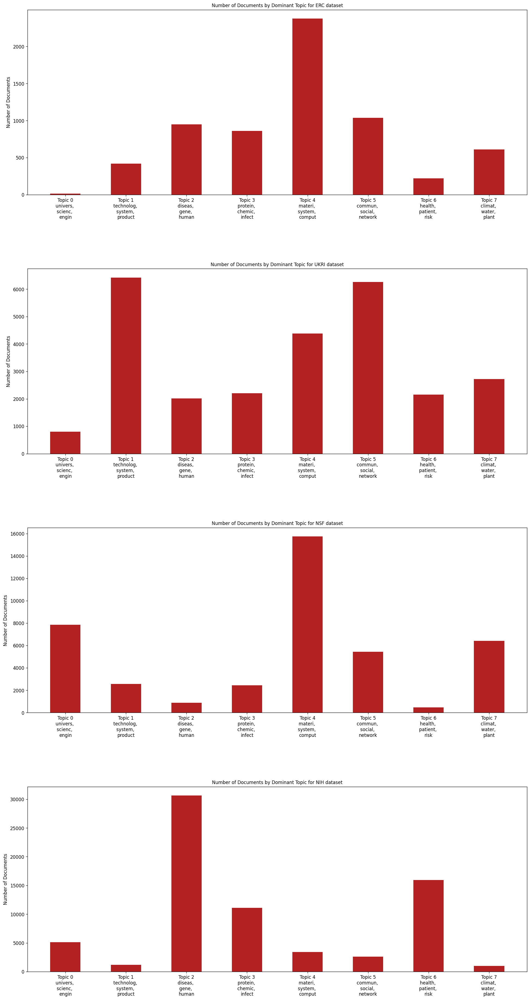

In [122]:
from matplotlib.ticker import FuncFormatter

# Plot
fig, axes = plt.subplots(4, 1, figsize=(16, 30), dpi=120, sharey=False)
fig.tight_layout()
plt.subplots_adjust(hspace = 0.4)

# Topic Distribution by Dominant Topics
inst = ["ERC", "UKRI", "NSF", "NIH"]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc[df_dominant_topic_in_each_doc['inst'] == inst[i]], width=.5, color='firebrick')
    ax.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
    tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
    ax.xaxis.set_major_formatter(tick_formatter)
    ax.set_title('Number of Documents by Dominant Topic for {} dataset'.format(inst[i]), fontdict=dict(size=10))
    ax.set_ylabel('Number of Documents')
#     ax.set_ylim(0, df_dominant_topic_in_each_doc.loc[df_dominant_topic_in_each_doc['inst'] == inst[i], 'count'].max())
#     ax.autoscale(enable=True, axis='y', tight=None)

# # Topic Distribution by Topic Weights
# ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='steelblue')
# ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
# ax2.xaxis.set_major_formatter(tick_formatter)
# ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

fig.savefig('../Results/num_doc_by_dominant_weightage.pdf')
plt.show()

# 13. t-SNE Clustering Chart

Let’s visualize the clusters of documents in a 2D space using t-SNE (t-distributed stochastic neighbor embedding) algorithm.

In [427]:
# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# Get topic weights
topic_weights = []
for i, row_list in enumerate(ldamodel[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 8
mycolors = np.array([color for name, color in mcolors.XKCD_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 136178 samples in 0.129s...
[t-SNE] Computed neighbors for 136178 samples in 8.266s...
[t-SNE] Computed conditional probabilities for sample 1000 / 136178
[t-SNE] Computed conditional probabilities for sample 2000 / 136178
[t-SNE] Computed conditional probabilities for sample 3000 / 136178
[t-SNE] Computed conditional probabilities for sample 4000 / 136178
[t-SNE] Computed conditional probabilities for sample 5000 / 136178
[t-SNE] Computed conditional probabilities for sample 6000 / 136178
[t-SNE] Computed conditional probabilities for sample 7000 / 136178
[t-SNE] Computed conditional probabilities for sample 8000 / 136178
[t-SNE] Computed conditional probabilities for sample 9000 / 136178
[t-SNE] Computed conditional probabilities for sample 10000 / 136178
[t-SNE] Computed conditional probabilities for sample 11000 / 136178
[t-SNE] Computed conditional probabilities for sample 12000 / 136178
[t-SNE] Computed conditional probabi

Loading BokehJS ...

# 15. Conclusion

We started from scratch by importing, cleaning and processing the newsgroups dataset to build the LDA model. Then we saw multiple ways to visualize the outputs of topic models including the word clouds and sentence coloring, which intuitively tells you what topic is dominant in each topic. A t-SNE clustering and the pyLDAVis are provide more details into the clustering of the topics.